# Pipeline Sistem ALL

#### Workflow

Ambil Gambar -> ROI Cropping -> Restoration -> Color Correction -> Pre-processing (Resize, Binary Masking, Augment, dst.) -> Input ke model UNBCSM

### Library Uses

In [1]:
import cv2
import matplotlib.pyplot as plt
import os
import rawpy
import numpy as np

## #1 ROI Cropping + Restoration



### Image Ori Path

Memproses gambar: C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Hasil Pengambilan Data\Hasil Gambar\Subj_2\Samsung A52s\right.dng


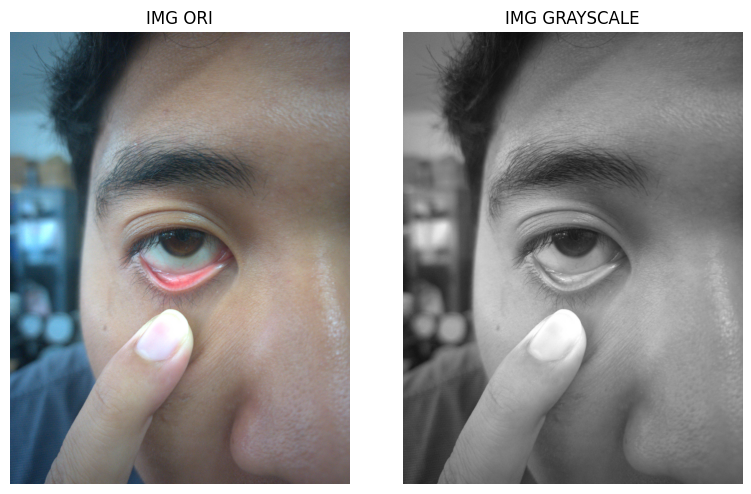

Image shape : (4624, 3468, 3)


In [16]:
img_path = r"C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Hasil Pengambilan Data\Hasil Gambar\Subj_2\Samsung A52s\right.dng"

if not os.path.exists(img_path):
    print(f"Error: Gambar '{img_path}' tidak ditemukan di direktori saat ini.")
else:
    print(f"Memproses gambar: {img_path}")

    with rawpy.imread(img_path) as raw:
        # dimiripin nanti sama penggunaan di color correction
        img_rgb = raw.postprocess(use_camera_wb=True, exp_shift=1.0)

    fig, axes = plt.subplots(1, 2, figsize=(8, 5))
    axes[0].imshow(img_rgb)
    axes[0].set_title('IMG ORI')
    axes[0].axis('off')

    img_bgr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)

    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    axes[1].imshow(gray, cmap='gray')
    axes[1].set_title('IMG GRAYSCALE')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()


print(f"Image shape : {img_rgb.shape}")

### HSV Masking for Eye Detection

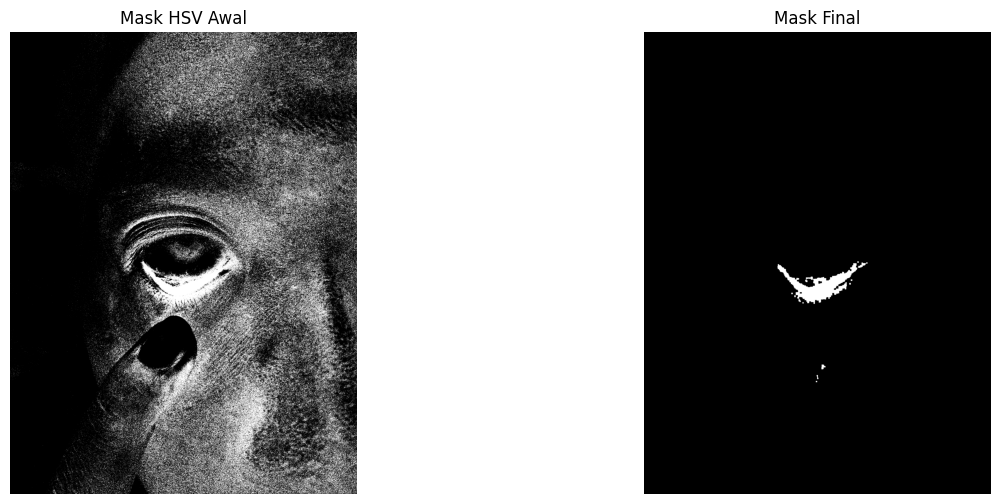

In [17]:
hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)

# warna merah ada di ujung angka (0-15 dan 160-180)

lower_red1 = np.array([0, 40, 50])      # [Hue, Saturation, Value]
upper_red1 = np.array([15, 255, 255])

lower_red2 = np.array([160, 40, 50])
upper_red2 = np.array([180, 255, 255])

mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
mask_kemerahan = mask1 + mask2

kernel = np.ones((7,7), np.uint8)

mask_bersih = cv2.morphologyEx(mask_kemerahan, cv2.MORPH_OPEN, kernel, iterations=2)

mask_bersih = cv2.morphologyEx(mask_bersih, cv2.MORPH_CLOSE, kernel, iterations=2)

fig, ax = plt.subplots(1, 2, figsize=(15, 6))
ax[0].imshow(mask_kemerahan, cmap='gray')
ax[0].set_title("Mask HSV Awal")
ax[0].axis('off')

ax[1].imshow(mask_bersih, cmap='gray')
ax[1].set_title("Mask Final")
ax[1].axis('off')

plt.show()

Area konjungtiva yang terdeteksi: 110328.0 piksel


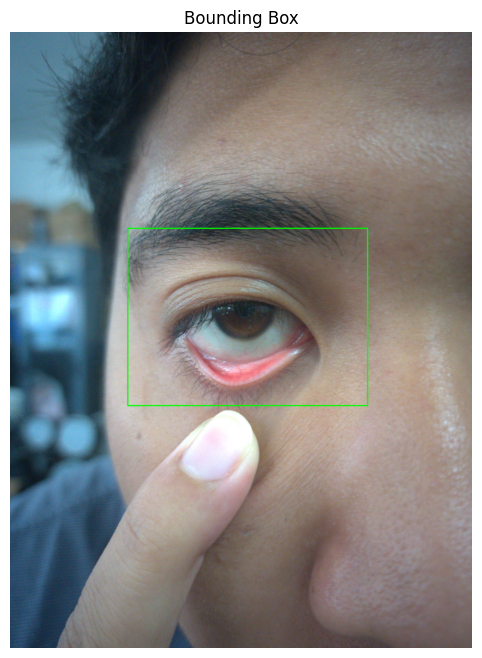

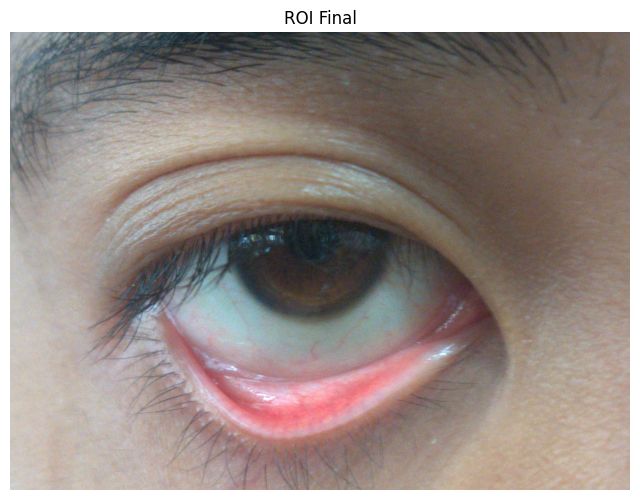

Image Cropped Size : (1331, 1800, 3)


In [18]:
contours, _ = cv2.findContours(mask_bersih, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

img_visualisasi = img_rgb.copy()

if len(contours) > 0:
    kontur_terbesar = max(contours, key=cv2.contourArea)
    area = cv2.contourArea(kontur_terbesar)

    print(f"Area konjungtiva yang terdeteksi: {area} piksel")

    if area > 1000:
        x, y, w, h = cv2.boundingRect(kontur_terbesar)

        margin_atas = int(h * 2)
        margin_bawah = int(h * 0.2)
        margin_samping = int(w * 0.5)

        img_h, img_w, _ = img_rgb.shape

        x_min = max(0, x - margin_samping)
        y_min = max(0, y - margin_atas)  # y dikurangi margin_atas karena koordinat 0 ada di atas
        x_max = min(img_w, x + w + margin_samping)
        y_max = min(img_h, y + h + margin_bawah)

        cv2.rectangle(img_visualisasi, (x_min, y_min), (x_max, y_max), (0, 255, 0), 8)

        plt.figure(figsize=(10, 8))
        plt.imshow(img_visualisasi)
        plt.title("Bounding Box")
        plt.axis('off')
        plt.show()

        roi_mata_utuh = img_rgb[y_min:y_max, x_min:x_max]

        plt.figure(figsize=(8, 6))
        plt.imshow(roi_mata_utuh)
        plt.title("ROI Final")
        plt.axis('off')
        plt.show()

    else:
        print("Gumpalan merah/pink ditemukan, tapi terlalu kecil untuk dianggap sebagai konjungtiva.")
else:
    print("Sama sekali tidak ada area merah/pink yang terdeteksi di gambar ini.")

print(f"Image Cropped Size : {roi_mata_utuh.shape}")

## Resizing

In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import rawpy

def crop_and_resize_sync(original_img_rgb, binary_mask_path, x_min, y_min, x_max, y_max, target_width=512, target_height=682):

    # 1. Dapatkan dimensi gambar RAW asli (SEBELUM di-crop)
    raw_h, raw_w = original_img_rgb.shape[:2]

    # 2. Lakukan Crop pada Gambar RGB
    img_rgb_cropped = original_img_rgb[y_min:y_max, x_min:x_max]

    # 3. Load Binary Mask Original dari CVAT
    original_mask = cv2.imread(binary_mask_path, cv2.IMREAD_GRAYSCALE)
    if original_mask is None:
        raise ValueError(f"Mask tidak ditemukan di path: {binary_mask_path}")

    mask_h, mask_w = original_mask.shape

    print("=== DEBUGGING DIMENSI ===")
    print(f"Dimensi Gambar RAW Asli : {raw_w} x {raw_h} piksel")
    print(f"Dimensi Mask CVAT       : {mask_w} x {mask_h} piksel")
    print(f"Koordinat Crop B.Box    : X({x_min}:{x_max}), Y({y_min}:{y_max})")

    # 4. PENYELARASAN DIMENSI (THE ULTIMATE FIX)
    # Jika ukuran mask dari CVAT ternyata berbeda dengan gambar RAW, paksa samakan ukurannya!
    if mask_w != raw_w or mask_h != raw_h:
        print("-> [INFO] Terjadi perbedaan ukuran! Menarik mask CVAT ke resolusi RAW...")
        original_mask = cv2.resize(original_mask, (raw_w, raw_h), interpolation=cv2.INTER_NEAREST)
    else:
        print("-> [INFO] Ukuran mask CVAT dan RAW sudah sama.")

    # 5. PROSES CROPPING MASK
    # Karena resolusi sudah pasti sama, koordinat Bounding Box dijamin 100% akurat
    mask_cropped = original_mask[y_min:y_max, x_min:x_max]

    # 6. Resize Gambar RGB dan Mask hasil crop ke resolusi U-Net (682x512)
    resized_img = cv2.resize(img_rgb_cropped, (target_width, target_height), interpolation=cv2.INTER_LINEAR)
    resized_mask = cv2.resize(mask_cropped, (target_width, target_height), interpolation=cv2.INTER_NEAREST)

    return resized_img, resized_mask

# --- EKSEKUSI DAN VISUALISASI ---
# PASTIKAN kamu memasukkan 'img_rgb' (gambar utuh sebelum di crop), bukan 'roi_mata_utuh'

binary_mask_path = r"/content/drive/MyDrive/Keperluan TA/dataset/Hasil Pengambilan Data/Ground Truth/Subj_2/iPhone 11/right.png"

# Panggil fungsi dengan img_rgb utuh
resized_image, resized_mask = crop_and_resize_sync(
    original_img_rgb=img_rgb, # INGAT: Ini array gambar RAW UTUH dari cell sebelumnya
    binary_mask_path=binary_mask_path,
    x_min=x_min,
    y_min=y_min,
    x_max=x_max,
    y_max=y_max,
    target_width=512,
    target_height=682
)

# Visualisasi Hasil Akhir
fig, axes = plt.subplots(1, 2, figsize=(10, 6))
fig.suptitle(f"Input U-Net Final: {resized_image.shape[1]}x{resized_image.shape[0]} Piksel", fontsize=16, fontweight='bold')

axes[0].imshow(resized_image)
axes[0].set_title("Resized RGB (Cropped)")
axes[0].axis('off')

axes[1].imshow(resized_mask, cmap='gray')
axes[1].set_title("Resized Binary Mask (Cropped)")
axes[1].axis('off')

plt.tight_layout()
plt.show()

ValueError: Mask tidak ditemukan di path: /content/drive/MyDrive/Keperluan TA/dataset/Hasil Pengambilan Data/Ground Truth/Subj_2/iPhone 11/right.png

In [20]:
# ==========================================
# PEMBUATAN OVERLAY EFEK TRANSPARAN
# ==========================================
# 1. Salin gambar RGB agar gambar aslinya tidak tertimpa
image_with_overlay = resized_image.copy()

# 2. Cari area di mana mask bernilai putih (lebih dari 0)
area_konjungtiva = resized_mask > 0

# 3. Tentukan warna overlay (RGB: [0, 255, 0] untuk Hijau Terang)
warna_hijau = np.array([0, 255, 0], dtype=np.uint8)

# 4. Terapkan Alpha Blending (Transparansi) HANYA pada area mask
# Tingkat transparansi (alpha): 0.4 artinya 40% warna hijau, 60% warna asli konjungtiva
alpha = 0.4
image_with_overlay[area_konjungtiva] = (
    warna_hijau * alpha + image_with_overlay[area_konjungtiva] * (1 - alpha)
).astype(np.uint8)

# ==========================================
# VISUALISASI HASIL AKHIR (3 KOLOM)
# ==========================================
fig, axes = plt.subplots(1, 3, figsize=(15, 6))
fig.suptitle(f"Validasi Input U-Net: {resized_image.shape[1]}x{resized_image.shape[0]} Piksel", fontsize=16, fontweight='bold')

# Kolom 1: Gambar RGB Hasil Crop & Resize
axes[0].imshow(resized_image)
axes[0].set_title("Resized RGB")
axes[0].axis('off')

# Kolom 2: Mask Hitam-Putih
axes[1].imshow(resized_mask, cmap='gray')
axes[1].set_title("Resized Binary Mask")
axes[1].axis('off')

# Kolom 3: Overlay Transparan
axes[2].imshow(image_with_overlay)
axes[2].set_title("Overlay (Hijau Transparan)")
axes[2].axis('off')

plt.tight_layout()
plt.show()

NameError: name 'resized_image' is not defined

### Image Restoration (Inpainting)

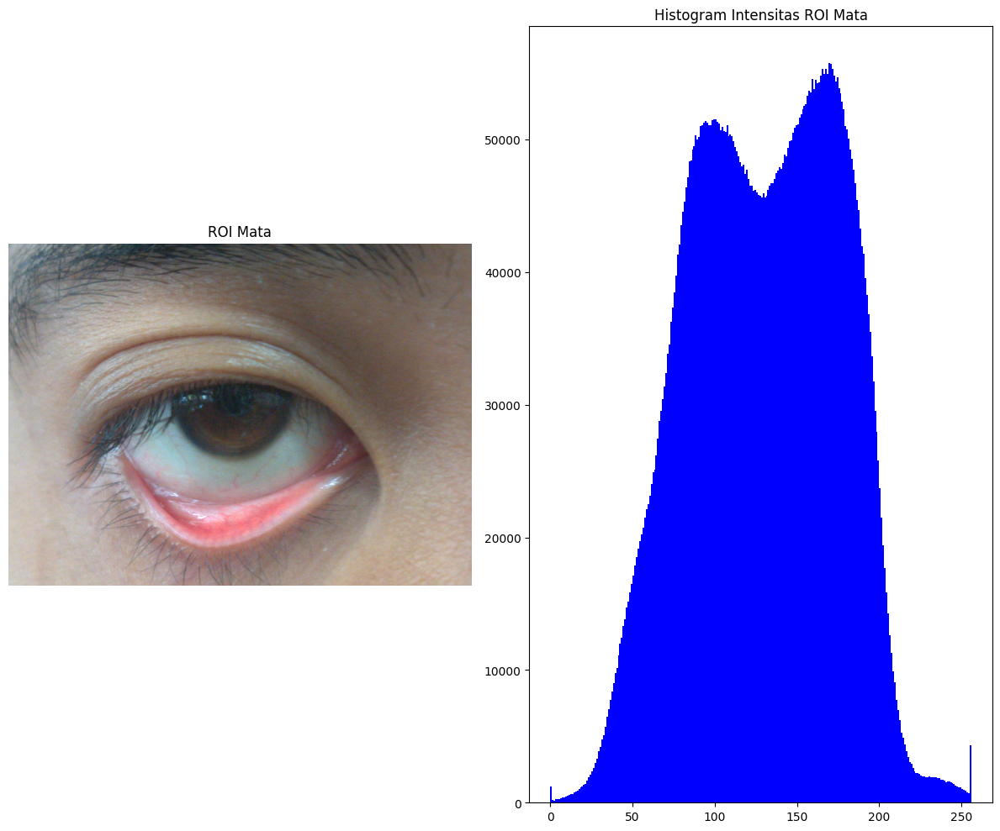

Shape ROI Mata: (1331, 1800, 3), Tipe Data: uint8
Nilai Minimum: 0, Nilai Maksimum: 255


In [21]:
fig, axes = plt.subplots(1, 2, figsize=(12, 10))
axes[0].imshow(roi_mata_utuh, cmap='gray')
axes[0].set_title('ROI Mata')
axes[0].axis('off')

axes[1].hist(roi_mata_utuh.ravel(), bins=256, range=[0,256], color='blue')
axes[1].set_title('Histogram Intensitas ROI Mata')

plt.tight_layout()
plt.show()


print(f"Shape ROI Mata: {roi_mata_utuh.shape}, Tipe Data: {roi_mata_utuh.dtype}")
print(f"Nilai Minimum: {roi_mata_utuh.min()}, Nilai Maksimum: {roi_mata_utuh.max()}")

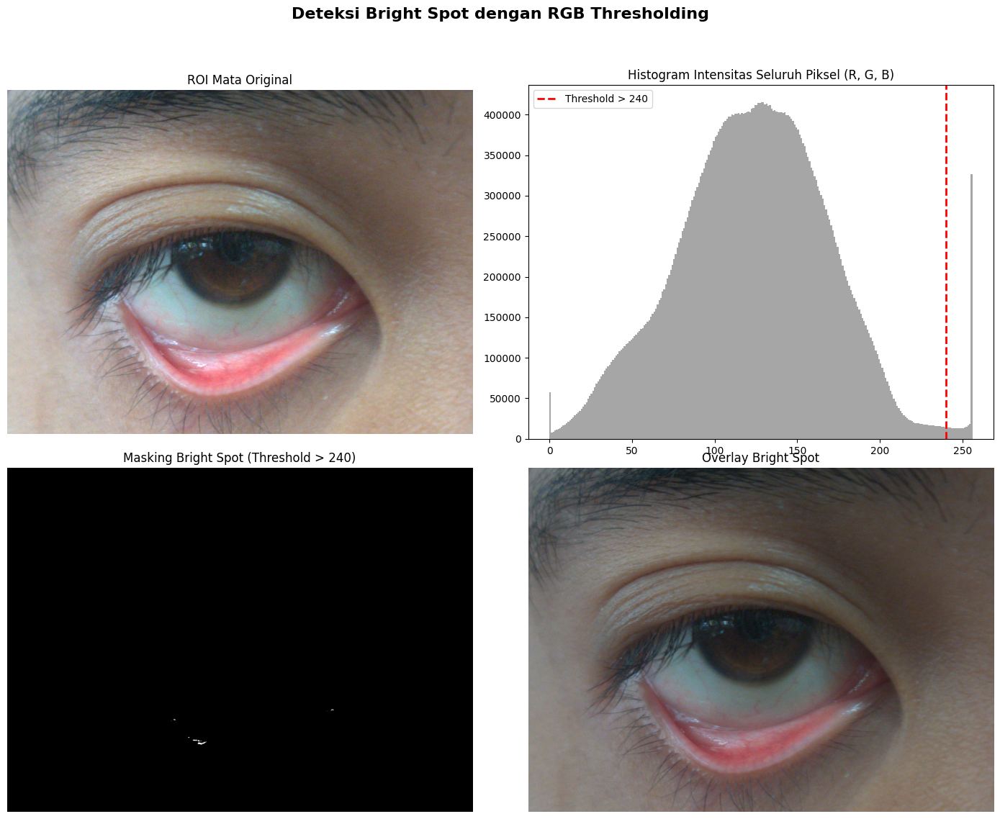

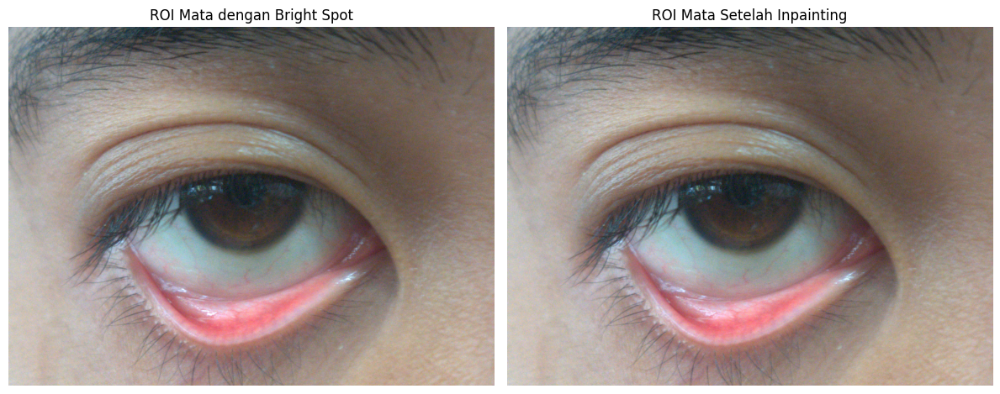

In [22]:
threshold = 240

R = roi_mata_utuh[:, :, 0]
G = roi_mata_utuh[:, :, 1]
B = roi_mata_utuh[:, :, 2]

mask_brightspots = (R > threshold) & (G > threshold) & (B > threshold)
mask_brightspots = mask_brightspots.astype(np.uint8) * 255

overlay_merah = np.zeros_like(roi_mata_utuh)
overlay_merah[:] = [0, 0, 0]

mask_berwarna = cv2.bitwise_and(overlay_merah, overlay_merah, mask=mask_brightspots)
roi_dengan_silau = cv2.addWeighted(roi_mata_utuh, 0.7, mask_berwarna, 0.3, 0)

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
fig.suptitle("Deteksi Bright Spot dengan RGB Thresholding", fontsize=16, fontweight='bold')

# Grafik 1: ROI Asli
axes[0, 0].imshow(roi_mata_utuh) # Menghapus cmap='gray' karena ini citra RGB berwarna
axes[0, 0].set_title('ROI Mata Original')
axes[0, 0].axis('off')

# Grafik 2: Histogram (Menyoroti area > 230)
axes[0, 1].hist(img_rgb.ravel(), bins=256, range=[0,256], color='gray', alpha=0.7)
# Menambahkan garis batas (threshold) di histogram
axes[0, 1].axvline(x=threshold, color='red', linestyle='dashed', linewidth=2, label=f'Threshold > {threshold}')
axes[0, 1].set_title('Histogram Intensitas Seluruh Piksel (R, G, B)')
axes[0, 1].legend()

# Grafik 3: Masking Hitam-Putih
axes[1, 0].imshow(mask_brightspots, cmap='gray')
axes[1, 0].set_title(f'Masking Bright Spot (Threshold > {threshold})')
axes[1, 0].axis('off')

# Grafik 4: Overlay Merah
axes[1, 1].imshow(roi_dengan_silau)
axes[1, 1].set_title('Overlay Bright Spot')
axes[1, 1].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Menyisakan ruang untuk suptitle
plt.show()

roi_mata_bgr = cv2.cvtColor(roi_mata_utuh, cv2.COLOR_RGB2BGR)

roi_bersih_bgr = cv2.inpaint(roi_mata_bgr, mask_brightspots, 3, cv2.INPAINT_TELEA)
roi_bersih_rgb = cv2.cvtColor(roi_bersih_bgr, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(12, 10))
axes[0].imshow(roi_mata_utuh)
axes[0].set_title('ROI Mata dengan Bright Spot')
axes[0].axis('off')

axes[1].imshow(roi_bersih_rgb)
axes[1].set_title('ROI Mata Setelah Inpainting')
axes[1].axis('off')

plt.tight_layout()
plt.show()

## #2 Color Correction

### Library Uses

In [32]:
import numpy as np
import cv2
import rawpy
import sys
import os
import pickle
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures

jalur_utama = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA'
if jalur_utama not in sys.path:
    sys.path.append(jalur_utama)

from scripts.reference_values import referenceColor
from scripts.ColorCorrectionML import ColorCorrectionML

INDEKS_KONJUNGTIVA = [1, 8, 14, 16] 
NAMA_PATCH = ["Light Skin", "Mod. Red", "Red", "Magenta"]

### Model Training with Each Patch of Coior Checker

In [58]:
path_cc = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Hasil Pengambilan Data\Hasil Gambar\Subj_2\Samsung A52s\cc.dng'

with rawpy.imread(path_cc) as raw:
    rgb_cc = raw.postprocess(use_camera_wb=True, exp_shift=1.0)

bgr_cc = cv2.cvtColor(rgb_cc, cv2.COLOR_RGB2BGR)

# Inisialisasi Class
cc_ml = ColorCorrectionML(bgr_cc, chart='Classic', illuminant='D50')
src_awal, _, _ = cc_ml.extract_color_chart()

method = 'pls' #'linear', 'lstsq', 'pls' 

kwargs = {
    'method': method,
    'degree': 3, # degree of polynomial
    'interactions_only': False, # only interactions terms
    'ncomp': 10, # number of components for PLS only
    'max_iter': 5000, # max iterations for PLS only
    'white_balance_mtd': 0 # 0: no white balance, 1: learningBasedWB, 2: simpleWB, 3: grayWorldWB,
}

print(f"Melatih model menggunakan metode: {method.upper()}...")

# Menggunakan **kwargs agar parameter menyesuaikan dengan dictionary di atas
model_cc, _ = cc_ml.compute_correction(
    show=False, 
    **kwargs
)

poly = PolynomialFeatures(degree=kwargs['degree'], interaction_only=kwargs['interactions_only'])
src_transformed = poly.fit_transform(src_awal)

# Logika prediksi disesuaikan dengan tipe model yang terpilih
if method in ['pls', 'linear']:
    src_akhir_raw = model_cc.predict(src_transformed)
elif method == 'lstsq':
    src_akhir_raw = np.matmul(src_transformed, model_cc)
else:
    raise ValueError("Metode tidak dikenali. Pilih antara 'linear', 'lstsq', atau 'pls'.")

# Batasi nilai rentang piksel ke 0-255
src_akhir = np.clip(src_akhir_raw, 0, 255)

# --- EVALUASI DELTA E ---
# Asumsi INDEKS_KONJUNGTIVA sudah didefinisikan sebelumnya (misal list/array indeks patch)
patch_sebelum = src_awal[INDEKS_KONJUNGTIVA]
patch_sesudah = src_akhir[INDEKS_KONJUNGTIVA]
patch_referensi = cc_ml.reference[INDEKS_KONJUNGTIVA]

dE_all_sesudah = ColorCorrectionML.DeltaE(src_akhir, cc_ml.reference)[2]
dE_konj_sesudah = ColorCorrectionML.DeltaE(patch_sesudah, patch_referensi)[2]

print(f"Final Mean Delta E (24 Patch Keseluruhan) : {dE_all_sesudah:.4f}")
print(f"Final Mean Delta E (4 Patch Konjungtiva)  : {dE_konj_sesudah:.4f}")
print("Model Training Finished")

Melatih model menggunakan metode: PLS...
Initial mean DeltaE:  11.9666415603
Number of components:  10
Final Mean Delta E (24 Patch Keseluruhan) : 3.5427
Final Mean Delta E (4 Patch Konjungtiva)  : 3.2704
Model Training Finished


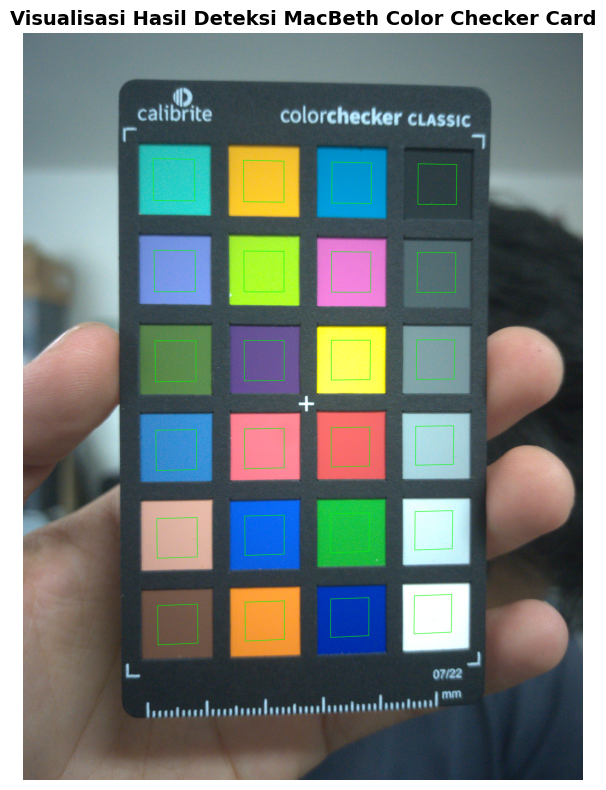

In [73]:
path_cc = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Hasil Pengambilan Data\Hasil Gambar\Subj_2\Samsung A52s\cc.dng'

with rawpy.imread(path_cc) as raw:
    rgb_cc = raw.postprocess(use_camera_wb=True, exp_shift=1.0)

bgr_cc = cv2.cvtColor(rgb_cc, cv2.COLOR_RGB2BGR)

cc_ml = ColorCorrectionML(bgr_cc, chart='Classic', illuminant='D50')

# --- MODIFIKASI DI SINI ---
# Ubah '_' kedua menjadi variabel 'img_draw' untuk mengambil gambar hasil deteksi
src_awal, img_draw, _ = cc_ml.extract_color_chart()

# =================================================================
# VISUALISASI DETEKSI COLOR CHART
# =================================================================
# Karena OpenCV membaca format BGR, konversikan ke RGB agar warna kartu pas saat di-plot
rgb_draw = cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 8))
plt.imshow(rgb_draw)
plt.title("Visualisasi Hasil Deteksi MacBeth Color Checker Card", fontsize=14, fontweight='bold')
plt.axis('off')  # Mematikan koordinat/ticks agar bersih
plt.tight_layout()
plt.show()
# =================================================================

### Numerical Evaluation

In [59]:
dE_sebelum = ColorCorrectionML.DeltaE(patch_sebelum, patch_referensi)[2]
dE_sesudah = ColorCorrectionML.DeltaE(patch_sesudah, patch_referensi)[2]

print(f"Mean Delta E (Sebelum Koreksi) : {dE_sebelum:.4f}")
print(f"Mean Delta E (Sesudah Koreksi) : {dE_sesudah:.4f}\n")

print(f"{'Nama Patch':<12} | {'Referensi Ideal':<16} | {'Sebelum (Kamera)':<16} | {'Sesudah (ML)':<16} | {'Selisih (Ref - ML)':<18}")
print("-" * 85)

for i in range(len(INDEKS_KONJUNGTIVA)):
    nama = NAMA_PATCH[i]
    ref = np.round(patch_referensi[i]).astype(int)
    seb = np.round(patch_sebelum[i]).astype(int)
    ses = np.round(patch_sesudah[i]).astype(int)
    diff = np.abs(ref - ses)

    ref_str = f"[{ref[0]:>3}, {ref[1]:>3}, {ref[2]:>3}]"
    seb_str = f"[{seb[0]:>3}, {seb[1]:>3}, {seb[2]:>3}]"
    ses_str = f"[{ses[0]:>3}, {ses[1]:>3}, {ses[2]:>3}]"
    diff_str = f"[{diff[0]:>3}, {diff[1]:>3}, {diff[2]:>3}]"
    print(f"{nama:<12} | {ref_str:<16} | {seb_str:<16} | {ses_str:<16} | {diff_str:<18}")

Mean Delta E (Sebelum Koreksi) : 16.3028
Mean Delta E (Sesudah Koreksi) : 3.2704

Nama Patch   | Referensi Ideal  | Sebelum (Kamera) | Sesudah (ML)     | Selisih (Ref - ML)
-------------------------------------------------------------------------------------
Light Skin   | [195, 149, 128]  | [220, 177, 161]  | [183, 139, 114]  | [ 12,  10,  14]   
Mod. Red     | [194,  84,  97]  | [255, 137, 153]  | [195,  90,  96]  | [  1,   6,   1]   
Red          | [175,  50,  57]  | [250, 109, 109]  | [187,  54,  55]  | [ 12,   4,   2]   
Magenta      | [188,  84, 150]  | [241, 129, 220]  | [187,  84, 165]  | [  1,   0,  15]   


Mean Delta E (Sebelum Koreksi) : 16.3028
Mean Delta E (Sesudah Koreksi) : 3.2704



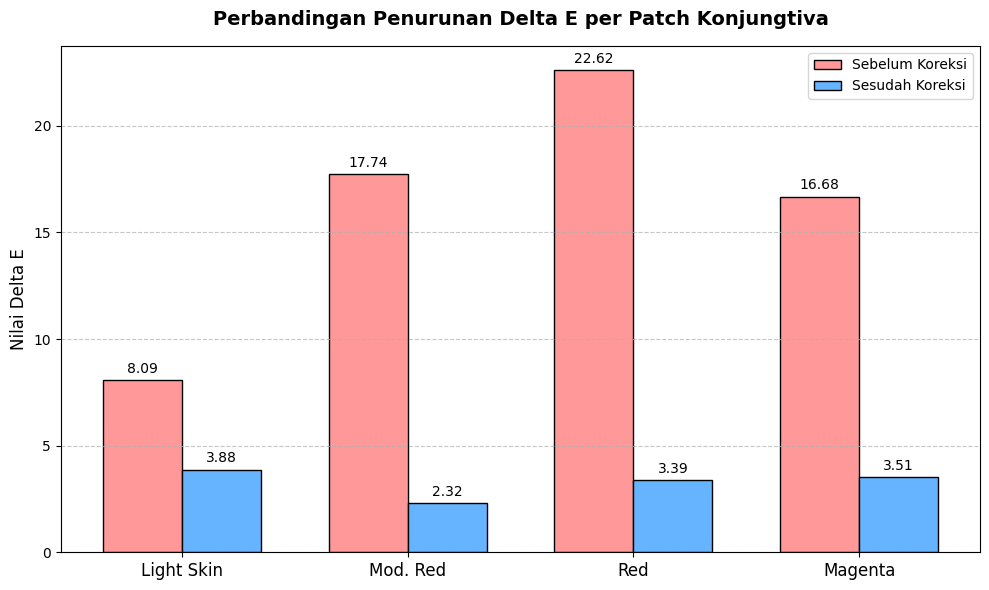

In [60]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung Rata-rata Delta E Keseluruhan Patch Konjungtiva
dE_sebelum_mean = ColorCorrectionML.DeltaE(patch_sebelum, patch_referensi)[2]
dE_sesudah_mean = ColorCorrectionML.DeltaE(patch_sesudah, patch_referensi)[2]

print(f"Mean Delta E (Sebelum Koreksi) : {dE_sebelum_mean:.4f}")
print(f"Mean Delta E (Sesudah Koreksi) : {dE_sesudah_mean:.4f}\n")

# Siapkan list untuk menyimpan nilai Delta E individual per patch
dE_patch_sebelum = []
dE_patch_sesudah = []
n_patches = len(INDEKS_KONJUNGTIVA)

for i in range(n_patches):
    # Ambil warna, bulatkan, dan pastikan rentang valid 0-255
    ref = np.clip(np.round(patch_referensi[i]), 0, 255).astype(int)
    seb = np.clip(np.round(patch_sebelum[i]), 0, 255).astype(int)
    ses = np.clip(np.round(patch_sesudah[i]), 0, 255).astype(int)
    
    # Hitung Delta E individual per patch
    # Array perlu di-reshape ke 2D (1, 3) agar sesuai dengan input fungsi DeltaE
    dE_seb_i = ColorCorrectionML.DeltaE(seb.reshape(1, 3), ref.reshape(1, 3))[2]
    dE_ses_i = ColorCorrectionML.DeltaE(ses.reshape(1, 3), ref.reshape(1, 3))[2]
    
    dE_patch_sebelum.append(dE_seb_i)
    dE_patch_sesudah.append(dE_ses_i)

# --- GRAFIK BATANG DELTA E ---
fig, ax_bar = plt.subplots(figsize=(10, 6))
x_pos = np.arange(n_patches)
width = 0.35

# Buat batang grafik
bar1 = ax_bar.bar(x_pos - width/2, dE_patch_sebelum, width, label='Sebelum Koreksi', color='#ff9999', edgecolor='black')
bar2 = ax_bar.bar(x_pos + width/2, dE_patch_sesudah, width, label='Sesudah Koreksi', color='#66b3ff', edgecolor='black')

# Pengaturan label dan judul sumbu
ax_bar.set_ylabel('Nilai Delta E', fontsize=12)
ax_bar.set_title('Perbandingan Penurunan Delta E per Patch Konjungtiva', fontsize=14, fontweight='bold', pad=15)
ax_bar.set_xticks(x_pos)
ax_bar.set_xticklabels(NAMA_PATCH, fontsize=12)
ax_bar.legend()
ax_bar.grid(axis='y', linestyle='--', alpha=0.7)

# Tampilkan angka nilai Delta E tepat di atas setiap batang
for rects in [bar1, bar2]:
    for rect in rects:
        height = rect.get_height()
        ax_bar.annotate(f'{height:.2f}',
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 3),  # offset 3 poin ke atas dari ujung batang
                        textcoords="offset points",
                        ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

### Visualizing Evaluation

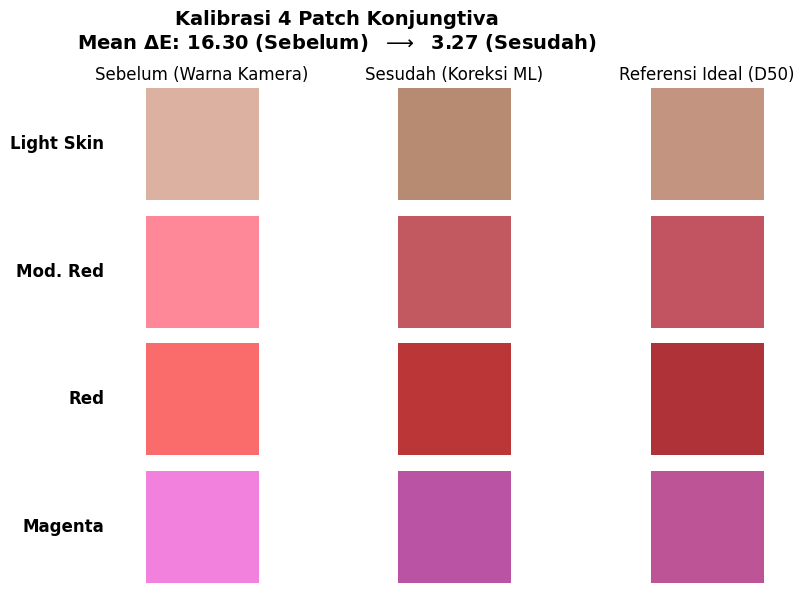

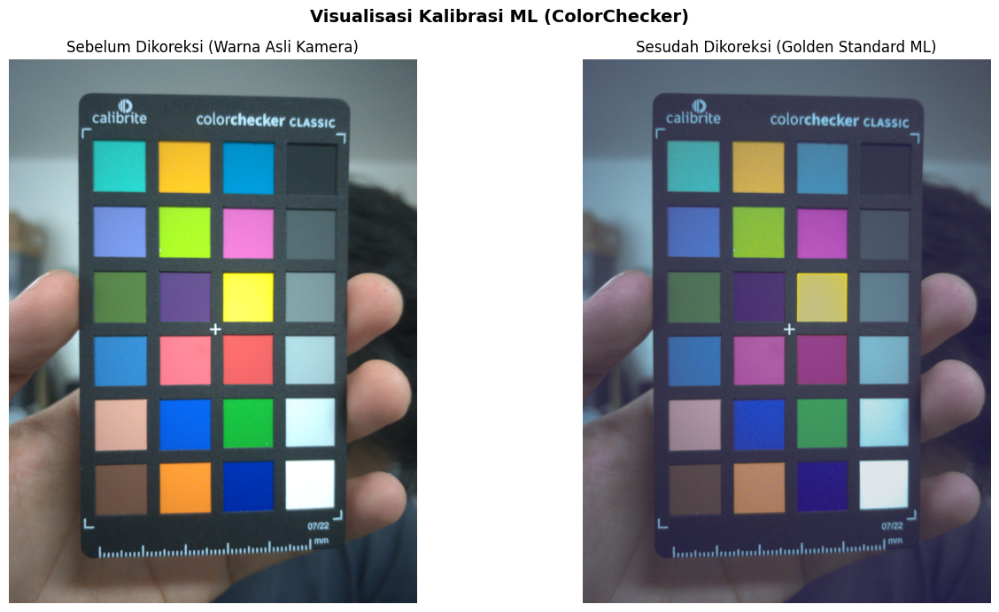

In [69]:
fig_patch, axes_patch = plt.subplots(len(INDEKS_KONJUNGTIVA), 3, figsize=(10, 6))
fig_patch.suptitle(f"Kalibrasi 4 Patch Konjungtiva\nMean \u0394E: {dE_sebelum:.2f} (Sebelum)  $\longrightarrow$  {dE_sesudah:.2f} (Sesudah)", fontsize=14, fontweight='bold')

axes_patch[0, 0].set_title("Sebelum (Warna Kamera)")
axes_patch[0, 1].set_title("Sesudah (Koreksi ML)")
axes_patch[0, 2].set_title("Referensi Ideal (D50)")

for i in range(len(INDEKS_KONJUNGTIVA)):
    c_seb = np.clip(patch_sebelum[i] / 255.0, 0, 1)
    c_ses = np.clip(patch_sesudah[i] / 255.0, 0, 1)
    c_ref = np.clip(patch_referensi[i] / 255.0, 0, 1)

    # -----------------------------------------------------
    # KOLOM 1: SEBELUM (Dengan Label Nama Patch)
    # -----------------------------------------------------
    axes_patch[i, 0].imshow([[c_seb]])
    # Matikan angka koordinat (ticks) agar bersih
    axes_patch[i, 0].set_xticks([])
    axes_patch[i, 0].set_yticks([])
    # Hilangkan garis tepi (spines) agar terlihat seperti axis('off')
    for spine in axes_patch[i, 0].spines.values():
        spine.set_visible(False)
    # Gunakan ylabel untuk nama patch agar marginnya otomatis dan rapi
    axes_patch[i, 0].set_ylabel(NAMA_PATCH[i], rotation=0, labelpad=30, va='center', ha='right', fontsize=12, fontweight='bold')

    # -----------------------------------------------------
    # KOLOM 2: SESUDAH
    # -----------------------------------------------------
    axes_patch[i, 1].imshow([[c_ses]])
    axes_patch[i, 1].axis('off')

    # -----------------------------------------------------
    # KOLOM 3: REFERENSI D50
    # -----------------------------------------------------
    axes_patch[i, 2].imshow([[c_ref]])
    axes_patch[i, 2].axis('off')

# Optimasi margin agar label di sebelah kiri tidak terpotong
plt.tight_layout()
plt.subplots_adjust(left=0.25, top=0.85, wspace=0.1)
plt.show()

# =================================================================
# VISUALISASI GAMBAR KESELURUHAN
# =================================================================
bgr_cc_corrected = cc_ml.correct_img(bgr_cc, show=False)
rgb_cc_corrected = cv2.cvtColor(bgr_cc_corrected, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(14, 7))
fig.suptitle("Visualisasi Kalibrasi ML (ColorChecker)", fontsize=14, fontweight='bold')

axes[0].imshow(cv2.cvtColor(bgr_cc, cv2.COLOR_BGR2RGB))
axes[0].set_title("Sebelum Dikoreksi (Warna Asli Kamera)")
axes[0].axis('off')

axes[1].imshow(rgb_cc_corrected)
axes[1].set_title("Sesudah Dikoreksi (Golden Standard ML)")
axes[1].axis('off')

plt.tight_layout()
plt.show()

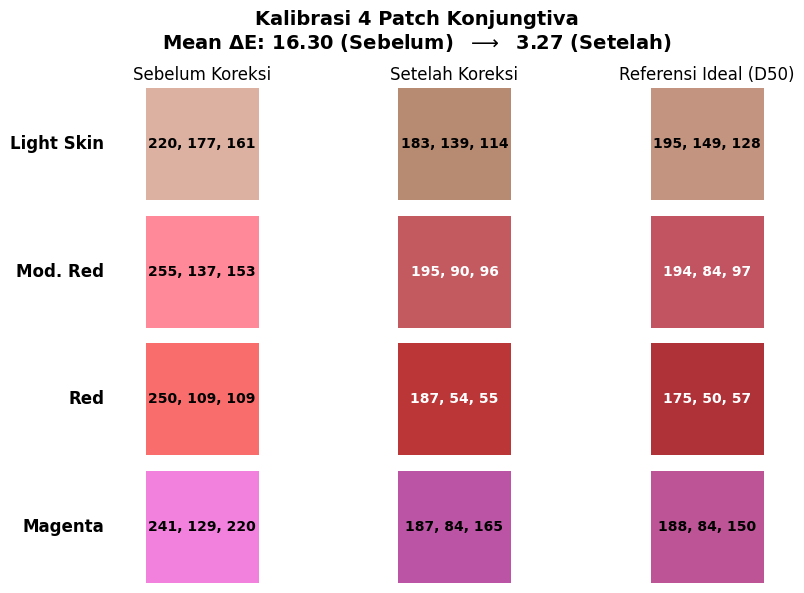

In [71]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

# Asumsi variabel dE_sebelum, dE_sesudah, INDEKS_KONJUNGTIVA, patch_sebelum, 
# patch_sesudah, patch_referensi, NAMA_PATCH, cc_ml, dan bgr_cc sudah tersedia

fig_patch, axes_patch = plt.subplots(len(INDEKS_KONJUNGTIVA), 3, figsize=(10, 6))
fig_patch.suptitle(f"Kalibrasi 4 Patch Konjungtiva\nMean \u0394E: {dE_sebelum:.2f} (Sebelum)  $\\longrightarrow$  {dE_sesudah:.2f} (Setelah)", 
                   fontsize=14, fontweight='bold', x=0.58, y=0.98)

axes_patch[0, 0].set_title("Sebelum Koreksi")
axes_patch[0, 1].set_title("Setelah Koreksi")
axes_patch[0, 2].set_title("Referensi Ideal (D50)")

for i in range(len(INDEKS_KONJUNGTIVA)):
    # Ambil nilai integer 0-255 untuk ditampilkan sebagai teks
    rgb_seb_int = np.clip(np.round(patch_sebelum[i]), 0, 255).astype(int)
    rgb_ses_int = np.clip(np.round(patch_sesudah[i]), 0, 255).astype(int)
    rgb_ref_int = np.clip(np.round(patch_referensi[i]), 0, 255).astype(int)

    # Normalisasi 0-1 untuk imshow
    c_seb = rgb_seb_int / 255.0
    c_ses = rgb_ses_int / 255.0
    c_ref = rgb_ref_int / 255.0

    # Menentukan warna teks (putih jika gelap, hitam jika terang)
    txt_col_seb = 'white' if np.mean(rgb_seb_int) < 128 else 'black'
    txt_col_ses = 'white' if np.mean(rgb_ses_int) < 128 else 'black'
    txt_col_ref = 'white' if np.mean(rgb_ref_int) < 128 else 'black'

    # -----------------------------------------------------
    # KOLOM 1: SEBELUM (Dengan Label Nama Patch)
    # -----------------------------------------------------
    axes_patch[i, 0].imshow([[c_seb]])
    # Teks RGB
    axes_patch[i, 0].text(0, 0, f"{rgb_seb_int[0]}, {rgb_seb_int[1]}, {rgb_seb_int[2]}", 
                          ha='center', va='center', color=txt_col_seb, fontsize=10, fontweight='bold')
    
    # Matikan angka koordinat (ticks) agar bersih
    axes_patch[i, 0].set_xticks([])
    axes_patch[i, 0].set_yticks([])
    # Hilangkan garis tepi (spines) agar terlihat seperti axis('off')
    for spine in axes_patch[i, 0].spines.values():
        spine.set_visible(False)
    # Gunakan ylabel untuk nama patch agar marginnya otomatis dan rapi
    axes_patch[i, 0].set_ylabel(NAMA_PATCH[i], rotation=0, labelpad=30, va='center', ha='right', fontsize=12, fontweight='bold')

    # -----------------------------------------------------
    # KOLOM 2: SESUDAH
    # -----------------------------------------------------
    axes_patch[i, 1].imshow([[c_ses]])
    axes_patch[i, 1].axis('off')
    # Teks RGB
    axes_patch[i, 1].text(0, 0, f"{rgb_ses_int[0]}, {rgb_ses_int[1]}, {rgb_ses_int[2]}", 
                          ha='center', va='center', color=txt_col_ses, fontsize=10, fontweight='bold')

    # -----------------------------------------------------
    # KOLOM 3: REFERENSI D50
    # -----------------------------------------------------
    axes_patch[i, 2].imshow([[c_ref]])
    axes_patch[i, 2].axis('off')
    # Teks RGB
    axes_patch[i, 2].text(0, 0, f"{rgb_ref_int[0]}, {rgb_ref_int[1]}, {rgb_ref_int[2]}", 
                          ha='center', va='center', color=txt_col_ref, fontsize=10, fontweight='bold')

# Optimasi margin agar label di sebelah kiri tidak terpotong
plt.tight_layout()
plt.subplots_adjust(left=0.25, top=0.85, wspace=0.1)
plt.show()

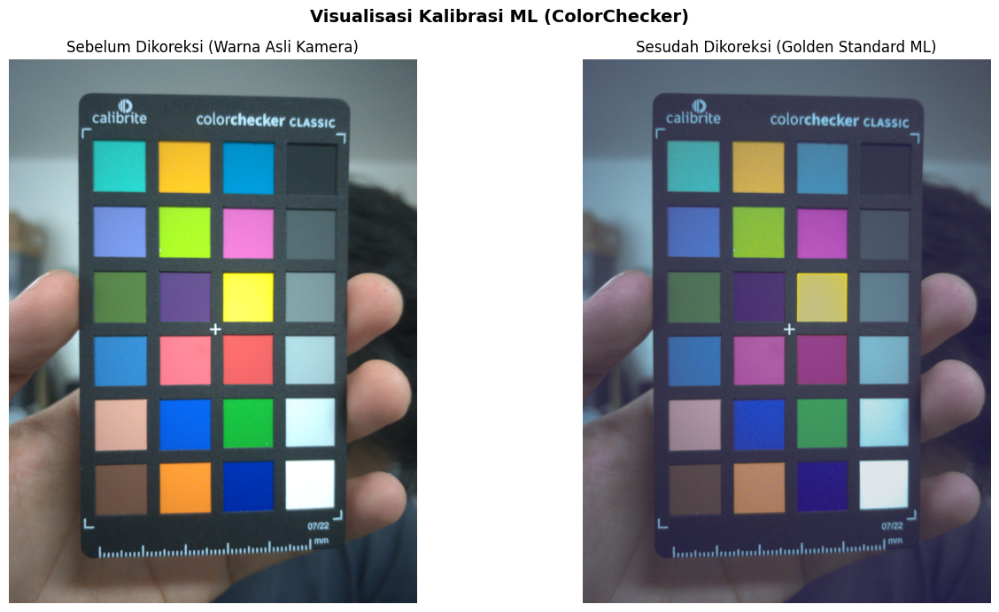

In [68]:
# =================================================================
# VISUALISASI GAMBAR KESELURUHAN
# =================================================================
bgr_cc_corrected = cc_ml.correct_img(bgr_cc, show=False)
rgb_cc_corrected = cv2.cvtColor(bgr_cc_corrected, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(14, 7))
fig.suptitle("Visualisasi Kalibrasi ML (ColorChecker)", fontsize=14, fontweight='bold')

axes[0].imshow(cv2.cvtColor(bgr_cc, cv2.COLOR_BGR2RGB))
axes[0].set_title("Sebelum Dikoreksi (Warna Asli Kamera)")
axes[0].axis('off')

axes[1].imshow(rgb_cc_corrected)
axes[1].set_title("Sesudah Dikoreksi (Golden Standard ML)")
axes[1].axis('off')

plt.tight_layout()
plt.show()

### Save Weight Model

In [62]:
folder_tujuan = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\models\weights\Color Correction\Samsung A52s'
os.makedirs(folder_tujuan, exist_ok=True)
nama_file_model = os.path.join(folder_tujuan, 'weight_1.pkl')

with open(nama_file_model, 'wb') as f:
    pickle.dump({'model': model_cc, 'poly': poly}, f)

print(f"Weight ML telah disimpan di dalam folder:\n{folder_tujuan}")

Weight ML telah disimpan di dalam folder:
C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\models\weights\Color Correction\Samsung A52s


### Load Weight Model

In [63]:
folder_tujuan = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\models\weights\Color Correction\Samsung A52s'
nama_file_model = os.path.join(folder_tujuan, 'weight_1.pkl')

with open(nama_file_model, 'rb') as f:
    data_kalibrasi = pickle.load(f)

model_cc = data_kalibrasi['model']
poly = data_kalibrasi['poly']

print("Weight Model berhasil dimuat")

Weight Model berhasil dimuat


### Chunking - Color Correction

In [64]:
img = roi_bersih_rgb.copy()  # Pastikan kita bekerja dengan salinan agar gambar asli tetap utuh

h, w, c = img.shape
img_flat = img.reshape(-1, 3)

# Mengakali NotFittedError dengan memberikan dummy 1 piksel
poly.fit(img_flat[:1])

# Menggunakan wadah float32 untuk mencegah Integer Overflow
img_corrected_flat = np.zeros_like(img_flat, dtype=np.float32)
chunk_size = 1_000_000

for i in range(0, len(img_flat), chunk_size):
    # Ubah potongan ke float32 sebelum masuk ke fungsi ML
    chunk = img_flat[i:i+chunk_size].astype(np.float32)

    chunk_poly = poly.transform(chunk)
    img_corrected_flat[i:i+chunk_size] = model_cc.predict(chunk_poly)

# Kembalikan ke format gambar normal dengan batas 0-255
img_corrected = np.clip(img_corrected_flat, 0, 255).astype(np.uint8).reshape(h, w, c)
#rgb_corrected = cv2.cvtColor(img_corrected, cv2.COLOR_BGR2RGB)
print("Color Correction selesai!")

Color Correction selesai!


Ukuran Gambar sebelum koreksi: (1331, 1800, 3)
Ukuran Gambar setelah koreksi: (1331, 1800, 3)


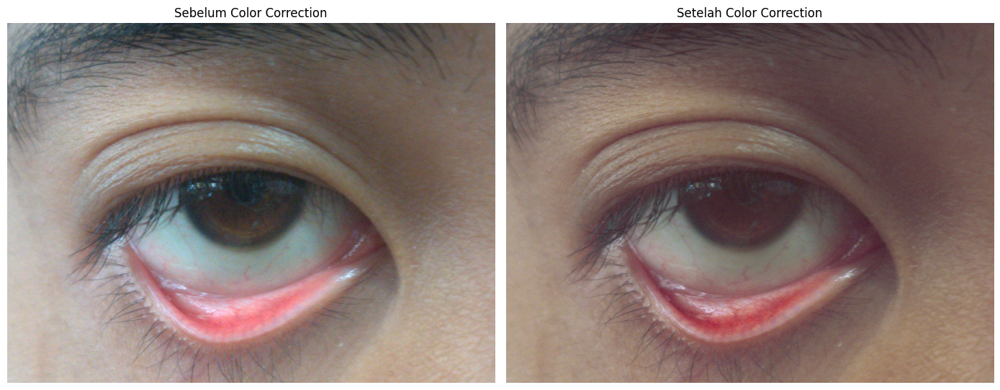

In [74]:
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

axes[0].imshow(img)
axes[0].set_title("Sebelum Color Correction")
axes[0].axis('off')

axes[1].imshow(img_corrected)
axes[1].set_title("Setelah Color Correction")
axes[1].axis('off')

print(f"Ukuran Gambar sebelum koreksi: {img.shape}")
print(f"Ukuran Gambar setelah koreksi: {img_corrected.shape}")

plt.tight_layout()
plt.show()

## #3 Pre-Processing ALL

In [ ]:
img_aug = img_corrected.copy()

### 1 - Binary Masking

### 2 - Resizing

Shape sebelum resize: (1175, 1175, 3)
Shape setelah resize: (512, 682, 3)


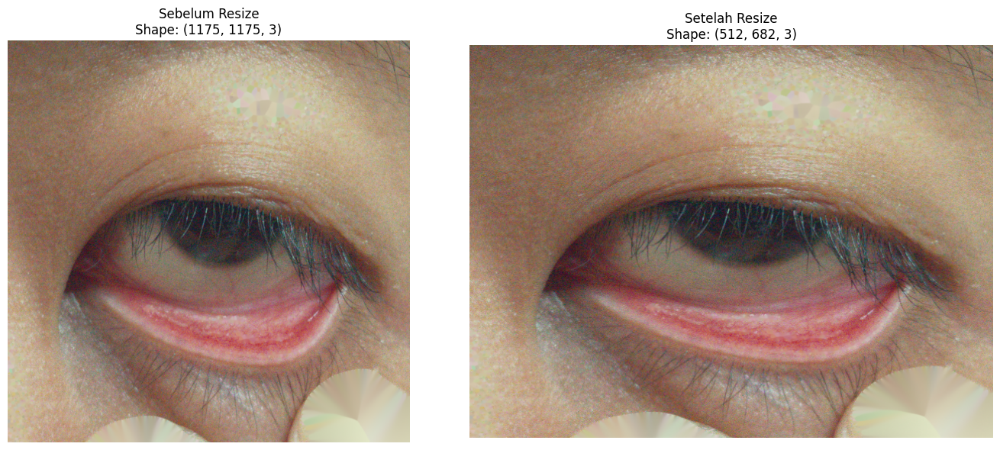

In [ ]:
print("Shape sebelum resize:", img_aug.shape)
resized_img = cv2.resize(img_aug, (682, 512), interpolation=cv2.INTER_LINEAR)
print("Shape setelah resize:", resized_img.shape)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].imshow(img_aug)
axes[0].set_title(f"Sebelum Resize\nShape: {img_aug.shape}")
axes[0].axis('off')

axes[1].imshow(resized_img)
axes[1].set_title(f"Setelah Resize\nShape: {resized_img.shape}")
axes[1].axis('off')

plt.tight_layout()
plt.show()

### 3 - Brightness Addition

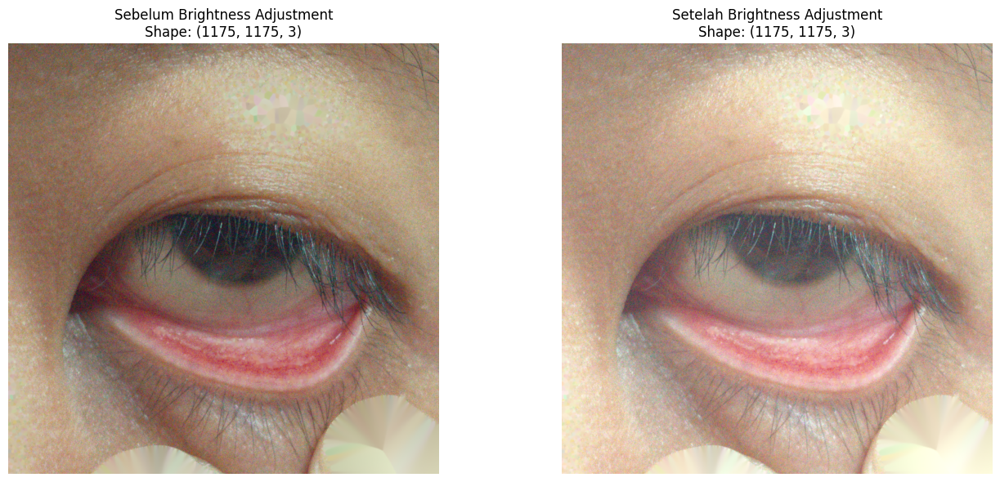

In [ ]:
# Konversi ke float untuk menghindari error batas atas (255)
img_float = img_aug.astype(np.float32)
img_float += 40
# Pangkas nilai agar tetap berada di antara 0 dan 255
np.clip(img_float, 0, 255, out=img_float)
ba_result = img_float.astype(np.uint8)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].imshow(img_aug)
axes[0].set_title(f"Sebelum Brightness Adjustment\nShape: {img_aug.shape}")
axes[0].axis('off')

axes[1].imshow(ba_result)
axes[1].set_title(f"Setelah Brightness Adjustment\nShape: {ba_result.shape}")
axes[1].axis('off')

plt.tight_layout()
plt.show()

### 4 - Gaussian Blur

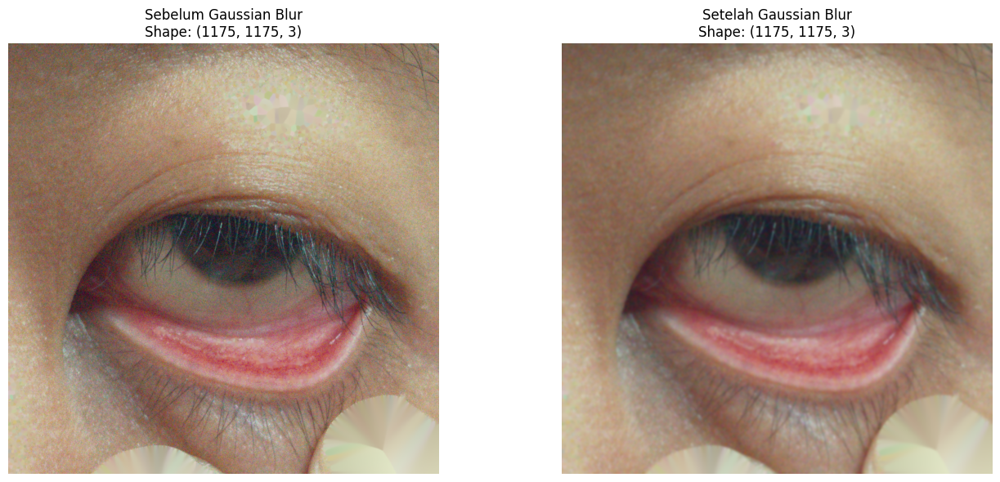

In [ ]:
blur_img = cv2.GaussianBlur(img_aug, (15, 15), 0)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].imshow(img_aug)
axes[0].set_title(f"Sebelum Gaussian Blur\nShape: {img_aug.shape}")
axes[0].axis('off')

axes[1].imshow(blur_img)
axes[1].set_title(f"Setelah Gaussian Blur\nShape: {blur_img.shape}")
axes[1].axis('off')

plt.tight_layout()
plt.show()

### 5 - Rotation

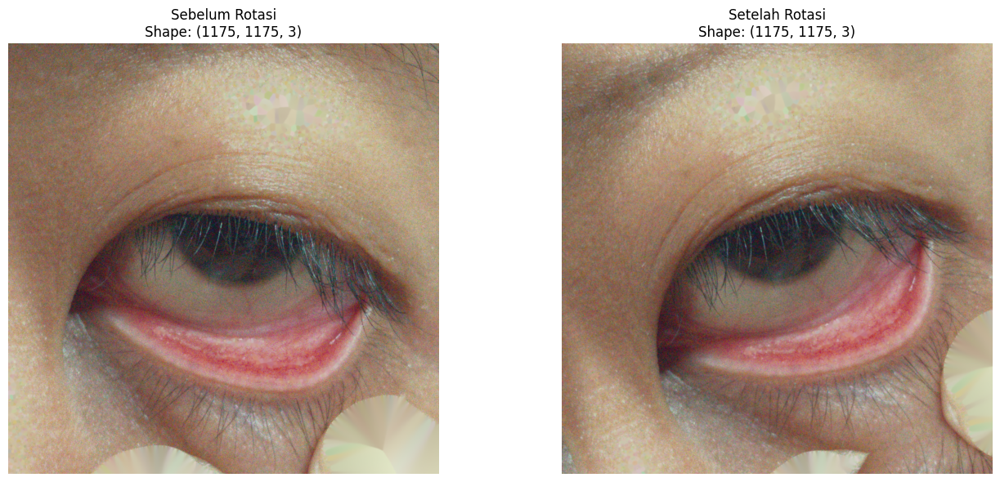

In [ ]:
angle = 25

h, w = img_aug.shape[:2]
center = (w // 2, h // 2)
# Buat matriks rotasi
M = cv2.getRotationMatrix2D(center, angle, 1.0)

# Rotasi Gambar (Gunakan INTER_LINEAR agar gambar tetap halus, border direfleksikan agar tidak hitam)
rotated_img = cv2.warpAffine(img_aug, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].imshow(img_aug)
axes[0].set_title(f"Sebelum Rotasi\nShape: {img_aug.shape}")
axes[0].axis('off')

axes[1].imshow(rotated_img)
axes[1].set_title(f"Setelah Rotasi\nShape: {rotated_img.shape}")
axes[1].axis('off')

plt.tight_layout()
plt.show()

### 6 - Flipping

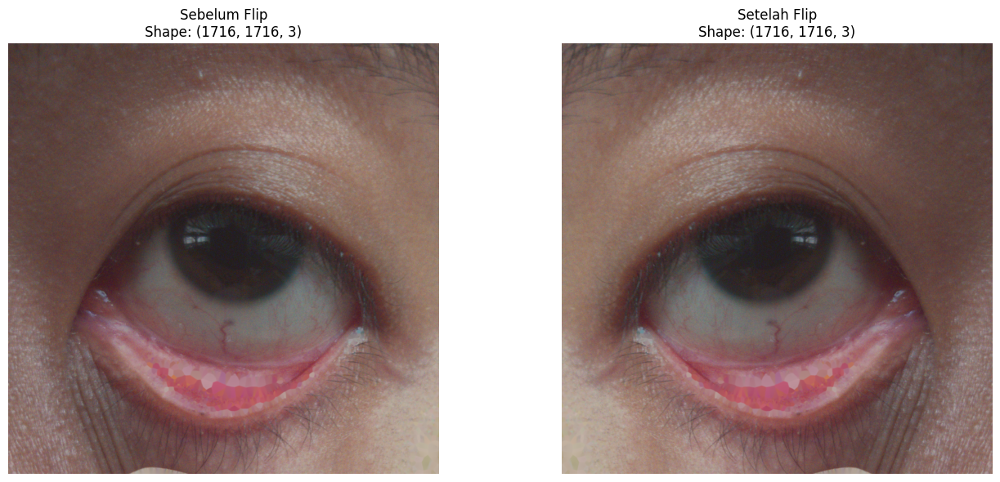

In [ ]:
# 0  = Flip Vertikal (atas ke bawah / sumbu X)
# 1  = Flip Horisontal (kiri ke kanan / sumbu Y)
# -1 = Flip Vertikal & Horisontal (kedua sumbu)
flip_mode = 1

flipped_img = cv2.flip(img_corrected, flip_mode)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].imshow(img_aug)
axes[0].set_title(f"Sebelum Flip\nShape: {img_aug.shape}")
axes[0].axis('off')

axes[1].imshow(flipped_img)
axes[1].set_title(f"Setelah Flip\nShape: {flipped_img.shape}")
axes[1].axis('off')

plt.tight_layout()
plt.show()


### 7 - Normalisasi

In [ ]:
img_normalized = img_aug.astype(np.float32) / 255.0